## Comprendre le principe de filtre


On va notamment s'intéresser dans cette première partie à la notion de noyau appliqué sur une image.

## Une image est une information
Une image est un condensé de données, que l'on appel les pixels.

Shape of the image (625, 625, 3)


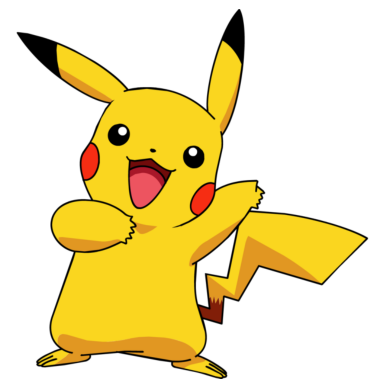

Shape of the image (232, 218, 3)


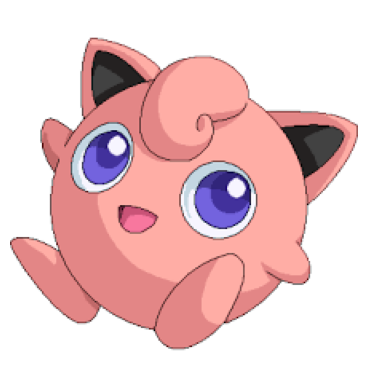

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from tensorflow import keras
from tensorflow.keras.models import Model
import tensorflow as tf

# Spécifie ton chemin local
base_path = r'C:\Users\Ordinateur\Documents\ipssi\IA\CNN'

# Chemins des sous-dossiers 'pikachu' et 'ronduoudou'
pikachu_folder = os.path.join(base_path, 'pikachu')  # Dossier des images Pikachu
rondoudou_folder = os.path.join(base_path, 'rondoudou')  # Dossier des images Rondoudou

# Nom des fichiers images
pikachu_image_name = 'cb3349b86ca661ca61ae9a36d88d70d4.png'  # Nom exact de l'image Pikachu
rondoudou_image_name = 'download (10).png'  # Nom exact de l'image Rondoudou

# Chemins complets des images
image_pikachu_path = os.path.join(pikachu_folder, pikachu_image_name)
image_rondoudou_path = os.path.join(rondoudou_folder, rondoudou_image_name)

# Charger l'image Pikachu depuis le dossier extrait
image_array_pikachu = cv2.imread(image_pikachu_path)

# Vérifier si l'image Pikachu a été correctement chargée
if image_array_pikachu is None:
    print(f"Erreur : L'image Pikachu n'a pas pu être chargée. Vérifie le chemin : {image_pikachu_path}")
else:
    print(f'Shape of the image {image_array_pikachu.shape}')
    plt.axis('off')
    plt.imshow(cv2.cvtColor(image_array_pikachu, cv2.COLOR_BGR2RGB))  # Convertir de BGR à RGB pour matplotlib
    plt.show()

# Charger l'image Rondoudou depuis le dossier extrait
image_array_rondoudou = cv2.imread(image_rondoudou_path)

# Vérifier si l'image Rondoudou a été correctement chargée
if image_array_rondoudou is None:
    print(f"Erreur : L'image Rondoudou n'a pas pu être chargée. Vérifie le chemin : {image_rondoudou_path}")
else:
    print(f'Shape of the image {image_array_rondoudou.shape}')
    plt.axis('off')
    plt.imshow(cv2.cvtColor(image_array_rondoudou, cv2.COLOR_BGR2RGB))
    plt.show()


Shape after resize: (40, 40, 3)
Shape after grayscale: (40, 40)
255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  000  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  
255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  000  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  
255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  000  000  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  
255  000  000  000  000  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  000  000  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  
255  255  000  000  000  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  255  000  255  000  255  25

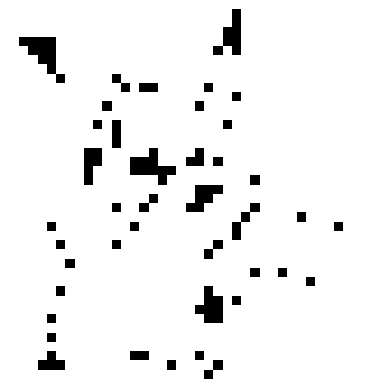

In [19]:
# Charger l'image Pikachu depuis le dossier extrait
image_pikachu = cv2.imread(image_pikachu_path)
if image_pikachu is None:
    print(f"Erreur : L'image Pikachu n'a pas pu être chargée. Vérifie le chemin : {image_pikachu_path}")
else:
    # Redimensionner l'image à 40x40 pixels
    res = cv2.resize(image_pikachu, dsize=(40, 40), interpolation=cv2.INTER_CUBIC)
    print(f'Shape after resize: {res.shape}')

    # Convertir l'image en niveaux de gris (1D)
    res = cv2.cvtColor(res, cv2.COLOR_BGR2GRAY)  # Convertir de BGR à GRAY
    print(f'Shape after grayscale: {res.shape}')

    # Appliquer un seuillage (thresholding)
    res = cv2.threshold(res, 127, 255, cv2.THRESH_BINARY)[1]

    # Afficher la matrice des pixels après seuil
    d = res
    for row in range(0, 40):
        for col in range(0, 40):
            print('%03d ' % d[row][col], end=' ')
        print('')

    # Affichage de l'image traitée
    plt.imshow(res, cmap='gray')
    plt.axis('off')
    plt.show()


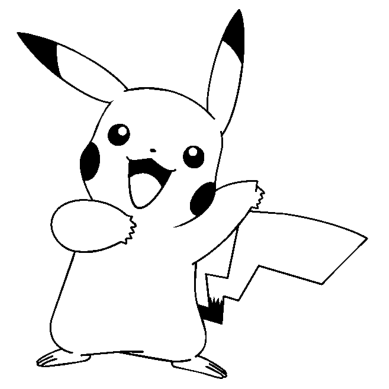

In [20]:
# Charger l'image Pikachu depuis le dossier extrait
image_pikachu = cv2.imread(image_pikachu_path)

# Vérifier si l'image Pikachu a été correctement chargée
if image_pikachu is None:
    print(f"Erreur : L'image Pikachu n'a pas pu être chargée. Vérifie le chemin : {image_pikachu_path}")
else:
    # Convertir l'image en niveaux de gris
    img_bw = cv2.cvtColor(image_pikachu, cv2.COLOR_BGR2GRAY)  # Conversion BGR à Grayscale

    # Appliquer un seuillage (thresholding)
    (thresh, img_bw) = cv2.threshold(img_bw, 127, 255, cv2.THRESH_BINARY)

    # Affichage de l'image binaire en niveaux de gris
    plt.axis('off')
    plt.imshow(img_bw, cmap='gray')  # Utilisation de 'gray' pour afficher l'image en niveaux de gris
    plt.show()


[[0 0 0]
 [0 1 0]
 [0 0 0]]


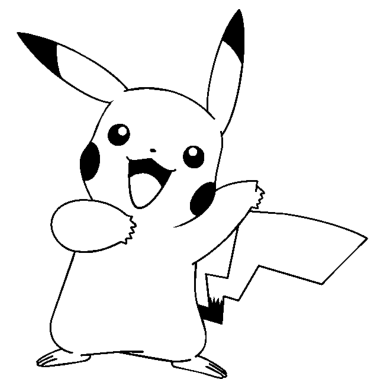

In [21]:
#defining an identity kernel, will change nothing because each pixel will remain with is value
kernel = np.matrix([[0,0,0],[0,1,0],[0,0,0]])
print(kernel)
img_1 = cv2.filter2D(img_bw, -1, kernel)
plt.axis('off')
plt.imshow(cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB))

[[-10   0  10]
 [-10   0  10]
 [-10   0  10]]


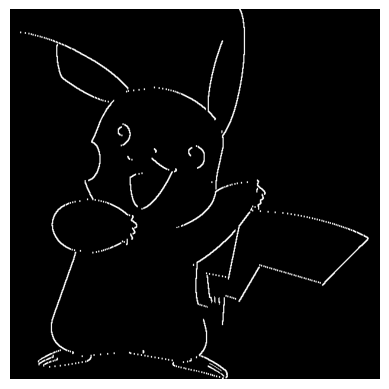

In [22]:
#defining a vertical edge detection kernel 
kernel = np.matrix([[-10,0,10],[-10,0,10],[-10,0,10]])
print(kernel)
img_1 = cv2.filter2D(img_bw, -1, kernel)
plt.axis('off')
plt.imshow(cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB))

[[ 10  10  10]
 [  0   0   0]
 [-10 -10 -10]]


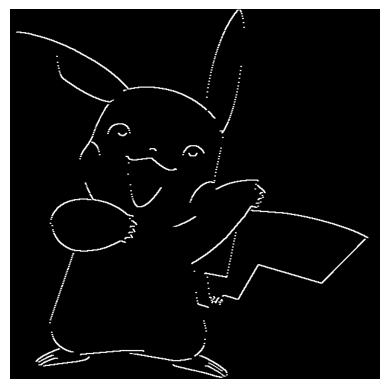

In [23]:
#defining an horizontal edge detection kernel 
kernel = np.matrix([[10,10,10],[0,0,0],[-10,-10,-10]])
print(kernel)
img_1 = cv2.filter2D(img_bw, -1, kernel)
plt.axis('off')
plt.imshow(cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB))

In [24]:
#example
from scipy.ndimage import convolve
m = [[10, 10, 1],[10, 1, 1],[-10, 1, 1]]
k = [[10, 10, 10],[0, 0, 0],[-10, -10, -10]]

c= convolve(m, k , mode='constant', cval=0.0)
print('Matrix')
print('\n'.join([''.join(['{:4}'.format(item) for item in row]) 
      for row in m]))

print('Kernel')
print('\n'.join([''.join(['{:4}'.format(item) for item in row]) 
      for row in k]))

print('Convolution')
print('\n'.join([''.join(['{:4}'.format(item) for item in row]) 
      for row in c]))

Matrix
  10  10   1
  10   1   1
 -10   1   1
Kernel
  10  10  10
   0   0   0
 -10 -10 -10
Convolution
 110 120  20
-290-290 -90
-110-120 -20


(3, 3)


<function matplotlib.pyplot.show(close=None, block=None)>

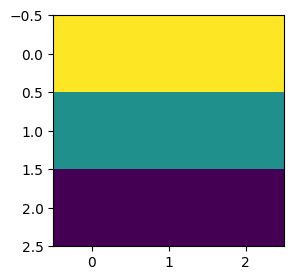

In [25]:
k2 = np.matrix(k)
f_min, f_max = k2.min(), k2.max()
filter = (k2 - f_min) / (f_max - f_min)
print(k2.shape)
fig= plt.figure(figsize=(3,3))
plt.imshow(k2)
plt.show

## Les réseaux de neurones convolutionnels CNN

On peut donc consdiérer un noyau comme un filtre appliqué à l'image pour en tirer des features. Dans un réseau de neurones convolutionnels c'est le réseau qui va trouver lui même les filtres a appliquer aux images. 


In [26]:
# Import dataset depuis le répertoire local
import pathlib
import os
import zipfile

# Chemin vers le fichier ZIP du dataset local
dataset_zip_path = r'C:\Users\Ordinateur\Documents\ipssi\IA\CNN\dataset.zip'  

# Chemin vers le dossier où extraire le dataset
extracted_folder = r'C:\Users\Ordinateur\Documents\ipssi\IA\CNN\dataset'  # Dossier où extraire les fichiers

# Si le dataset n'est pas encore extrait, on l'extrait
if not os.path.exists(extracted_folder):
    with zipfile.ZipFile(dataset_zip_path, 'r') as zip_ref:
        zip_ref.extractall(extracted_folder)
        print(f"Dataset extrait vers : {extracted_folder}")

# Définir le chemin d'accès au dataset extrait
data_dir = pathlib.Path(extracted_folder)

# Vérifier que le dataset a bien été extrait et afficher son chemin
print(f"Le dataset est situé à : {data_dir}")
print(f"Chemin absolu du dataset : {os.path.abspath(data_dir)}")
 

Le dataset est situé à : C:\Users\Ordinateur\Documents\ipssi\IA\CNN\dataset
Chemin absolu du dataset : C:\Users\Ordinateur\Documents\ipssi\IA\CNN\dataset


In [27]:
# Calcul du nombre total d'images dans les dossiers 'pikachu' et 'rondoudou'
image_count = len(list(data_dir.glob('pikachu/*'))) + len(list(data_dir.glob('rondoudou/*')))
print(image_count)


174


In [28]:
batch_size = 3
img_height = 200
img_width = 200

# Modifie le chemin vers le dataset local sur ton répertoire
data_dir = pathlib.Path(r'C:\Users\Ordinateur\Documents\ipssi\IA\CNN\dataset')

# Charge les données d'entraînement en filtrant seulement 'pikachu' et 'rondoudou'
train_data = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=42,
  image_size=(img_height, img_width),
  batch_size=batch_size,
  # Utilise class_names pour ne charger que les classes 'pikachu' et 'rondoudou'
  class_names=['pikachu', 'rondoudou']
)

# Charge les données de validation en filtrant seulement 'pikachu' et 'rondoudou'
val_data = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=42,
  image_size=(img_height, img_width),
  batch_size=batch_size,
  class_names=['pikachu', 'rondoudou']
)

# Affiche les classes pour vérifier que seules 'pikachu' et 'rondoudou' sont chargées
class_names = val_data.class_names
print(class_names)


Found 174 files belonging to 2 classes.
Using 140 files for training.
Found 174 files belonging to 2 classes.
Using 34 files for validation.
['pikachu', 'rondoudou']


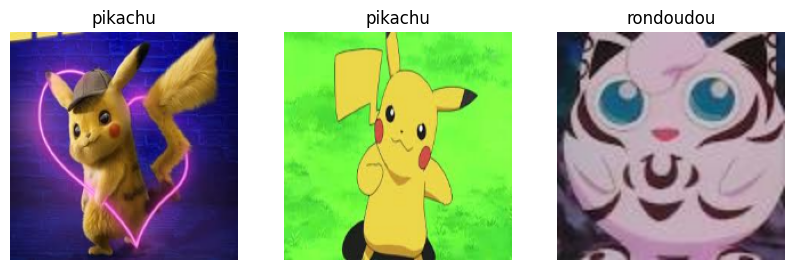

In [29]:
plt.figure(figsize=(10, 10))
for images, labels in train_data.take(1):
  for i in range(3):
    ax = plt.subplot(1, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [30]:
from tensorflow.keras import layers

num_classes = 2

model = tf.keras.Sequential([
    layers.Rescaling(1./255),  
    layers.Conv2D(128, 4, activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 4, activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 4, activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(16, 4, activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam',
              loss=tf.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

logdir = "logs"

tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir, histogram_freq=1, write_images=True)

model.fit(
    train_data,
    validation_data=val_data,
    epochs=2,
    callbacks=[tensorboard_callback]
)


Epoch 1/2
47/47 ━━━━━━━━━━━━━━━━━━━━ 38s 597ms/step - accuracy: 0.5809 - loss: 0.6904 - val_accuracy: 0.5588 - val_loss: 0.5064
Epoch 2/2
47/47 ━━━━━━━━━━━━━━━━━━━━ 28s 583ms/step - accuracy: 0.8357 - loss: 0.4545 - val_accuracy: 0.8235 - val_loss: 0.4531


In [31]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)         │ (None, 200, 200, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 197, 197, 128)  │         6,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 98, 98, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 95, 95, 64)     │       131,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 47, 47, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 44, 44, 32)     │        32,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 22, 22, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 19, 19, 16)     │         8,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 9, 9, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 1296)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │        83,008 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 784,664 (2.99 MB)

 Trainable params: 261,554 (1021.70 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 523,110 (2.00 MB)

FileUpload(value=(), accept='image/*', description='Upload')

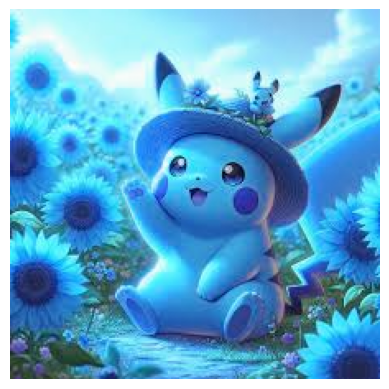

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
C'est un PIKACHU !


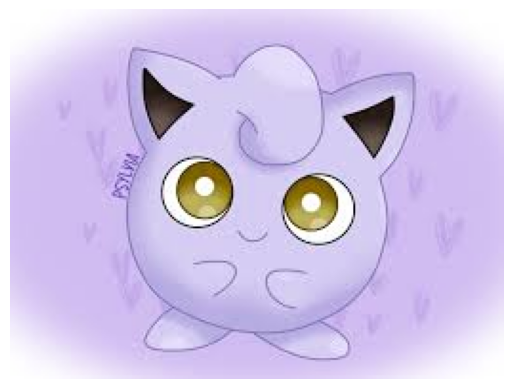

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
C'est un PIKACHU !


In [ ]:
import ipywidgets as widgets
from IPython.display import display
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt
from io import BytesIO

# Créer un widget de téléchargement d'image
upload_button = widgets.FileUpload(
    accept='image/*',  # Accepter uniquement les images
    multiple=False     # Permet une seule image à la fois
)

# Fonction de traitement et de prédiction
def on_upload_change(change):
    # Vérifier si un fichier a été téléchargé
    if upload_button.value:
        # Récupérer le fichier téléchargé
        uploaded_file = next(iter(upload_button.value))  # Utiliser le premier fichier téléchargé
        file_content = uploaded_file['content']  # Accéder au contenu du fichier
        
        # Charger l'image avec PIL depuis le contenu binaire
        image_to_predict = Image.open(BytesIO(file_content))
        
        # Convertir l'image en format approprié pour OpenCV
        image_to_predict_cv = np.array(image_to_predict)
        
        # Afficher l'image
        plt.imshow(cv2.cvtColor(image_to_predict_cv, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

        # Redimensionner l'image et ajouter une dimension
        image_resized = cv2.resize(image_to_predict_cv, (200, 200))

        # Normalisation de l'image : convertir les pixels de [0, 255] à [0, 1]
        img_to_predict = np.expand_dims(image_resized / 255.0, axis=0).astype(np.float32)

        # Prédire avec le modèle
        res = model.predict(img_to_predict)
        
        # Utiliser np.argmax pour obtenir la classe prédite
        predicted_class = np.argmax(res, axis=-1)
        
        # Afficher le résultat de la prédiction
        if predicted_class == 1:
            print("C'est un PIKACHU !")
        elif predicted_class == 0:
            print("C'est un RONDOUDOU !")

# Lier la fonction à l'événement de téléchargement du fichier
upload_button.observe(on_upload_change, names='value')

# Afficher le widget de téléchargement
display(upload_button)


#Understand the filters mades by the CNN

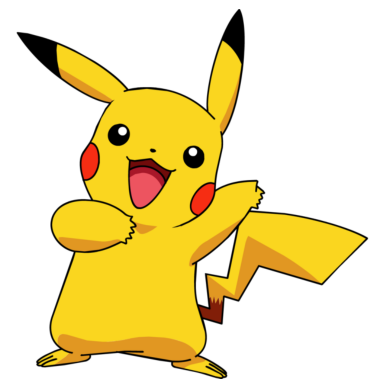

-----------------------------------------------------
1th layer: conv2d_4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
conv2d_4 | Features Shape: (1, 197, 197, 128)
Dimension: 128
-----------------------------------------------------
-----------------------------------------------------
2th layer: max_pooling2d_4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
max_pooling2d_4 | Features Shape: (1, 98, 98, 128)
Dimension: 128
-----------------------------------------------------
-----------------------------------------------------
3th layer: conv2d_5
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 672ms/step
conv2d_5 | Features Shape: (1, 95, 95, 64)
Dimension: 64
-----------------------------------------------------
-----------------------------------------------------
4th layer: max_pooling2d_5
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step
max_pooling2d_5 | Features Shape: (1, 47, 47, 64)
Dimension: 64
-----------------------------------------------------
-----------------------------------------------------
5th layer: conv2d

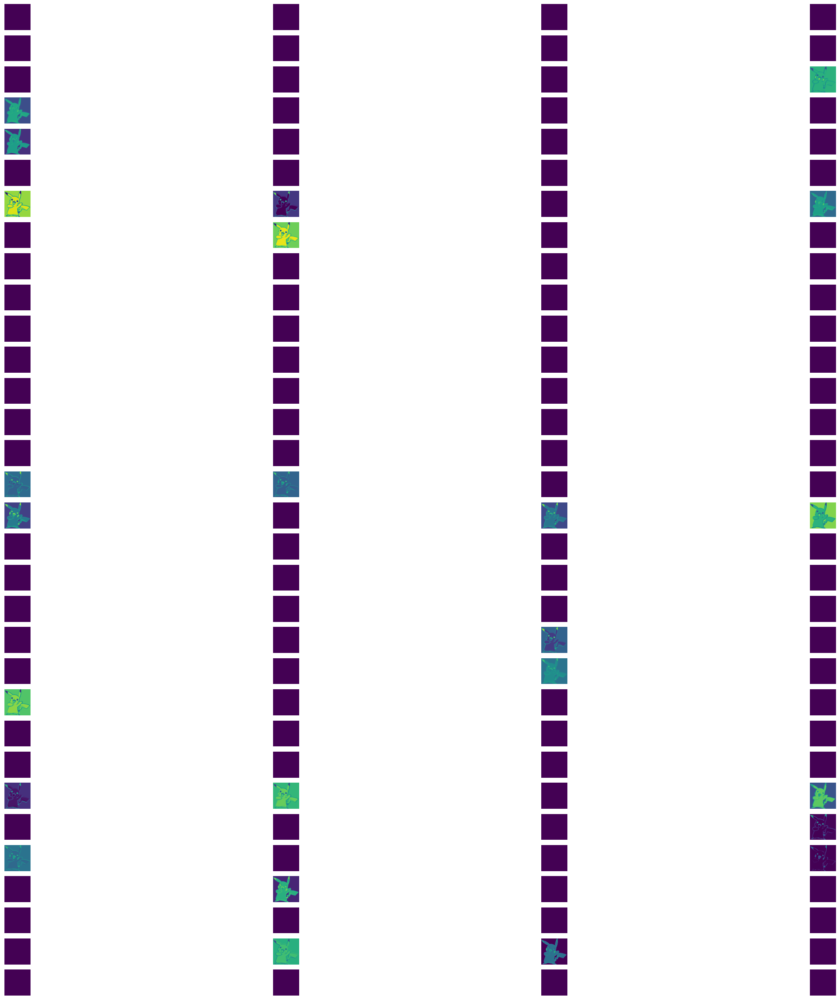

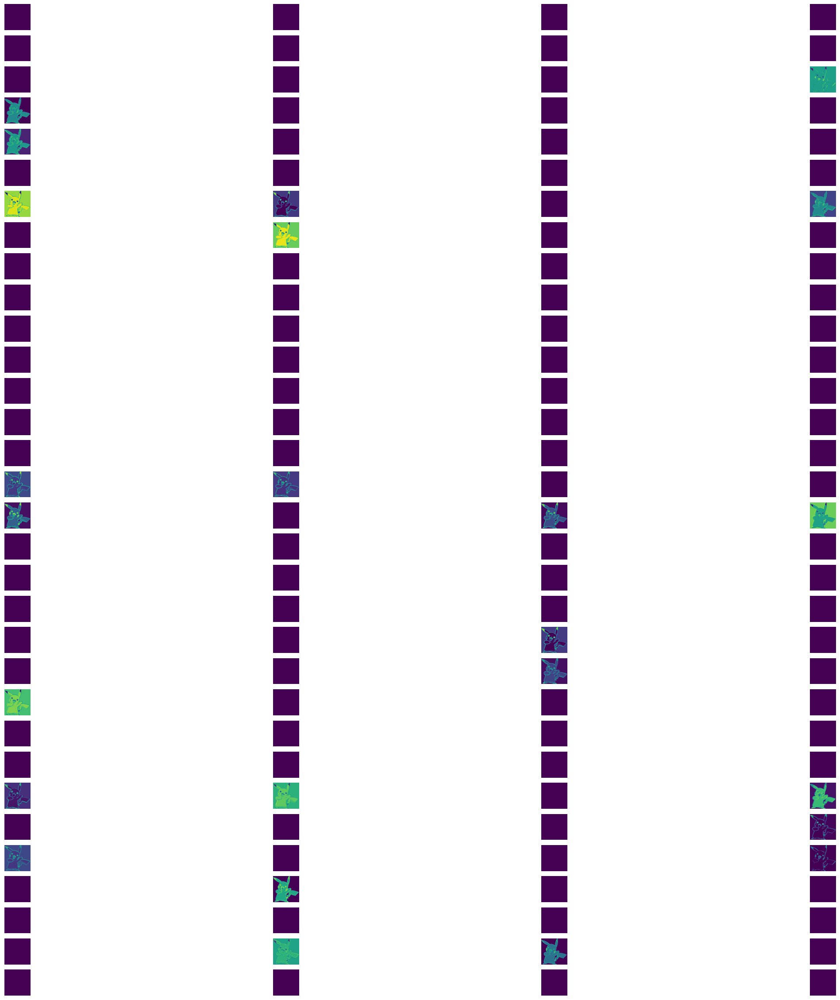

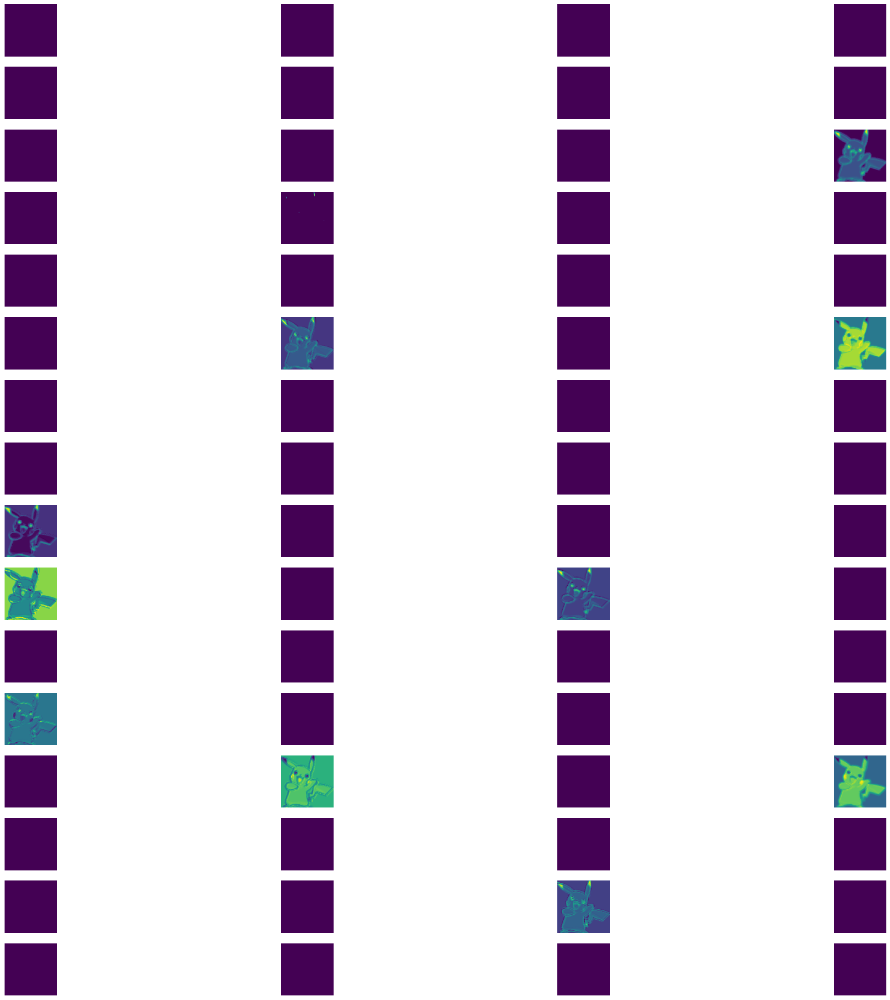

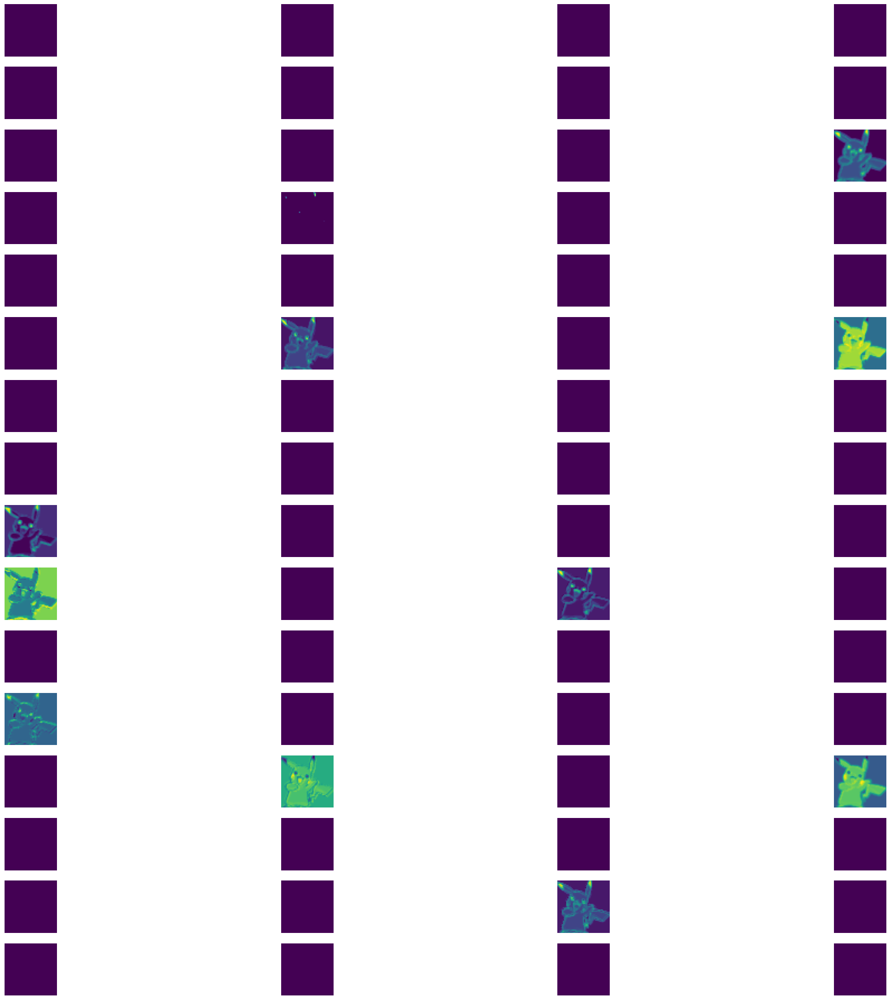

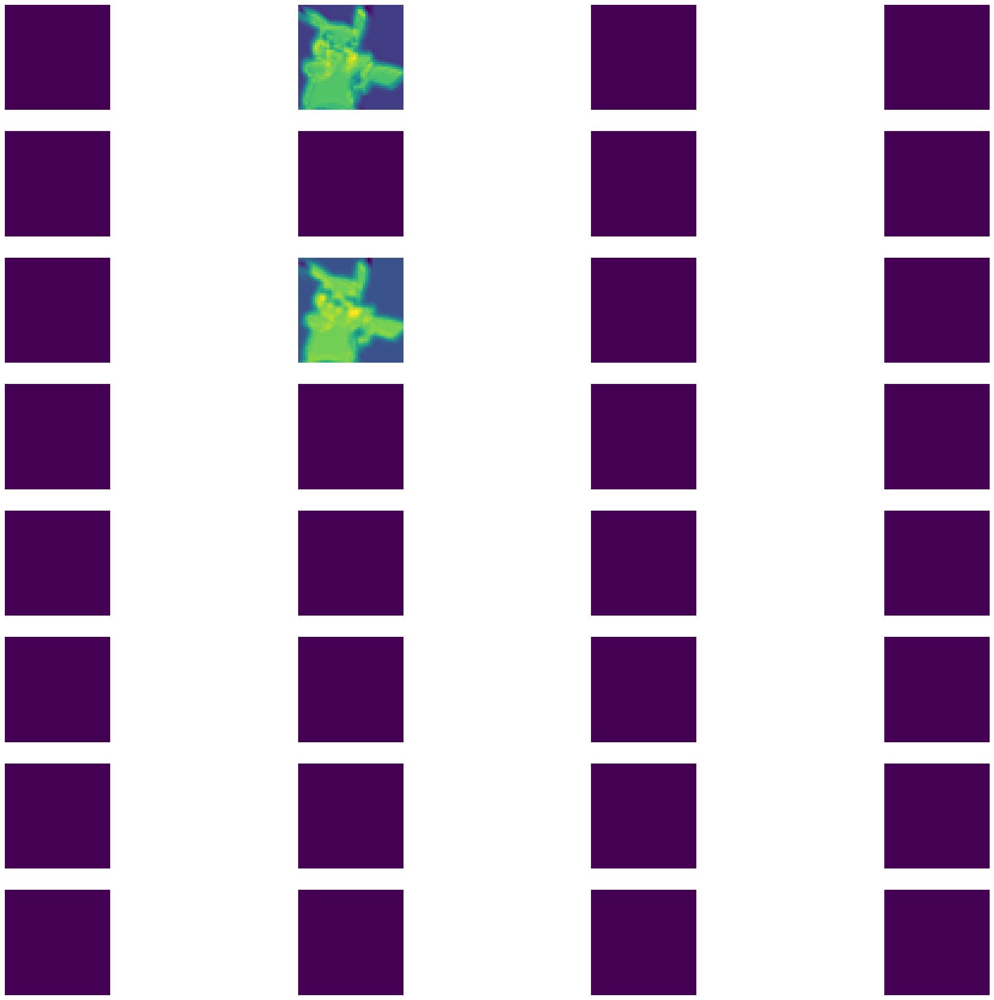

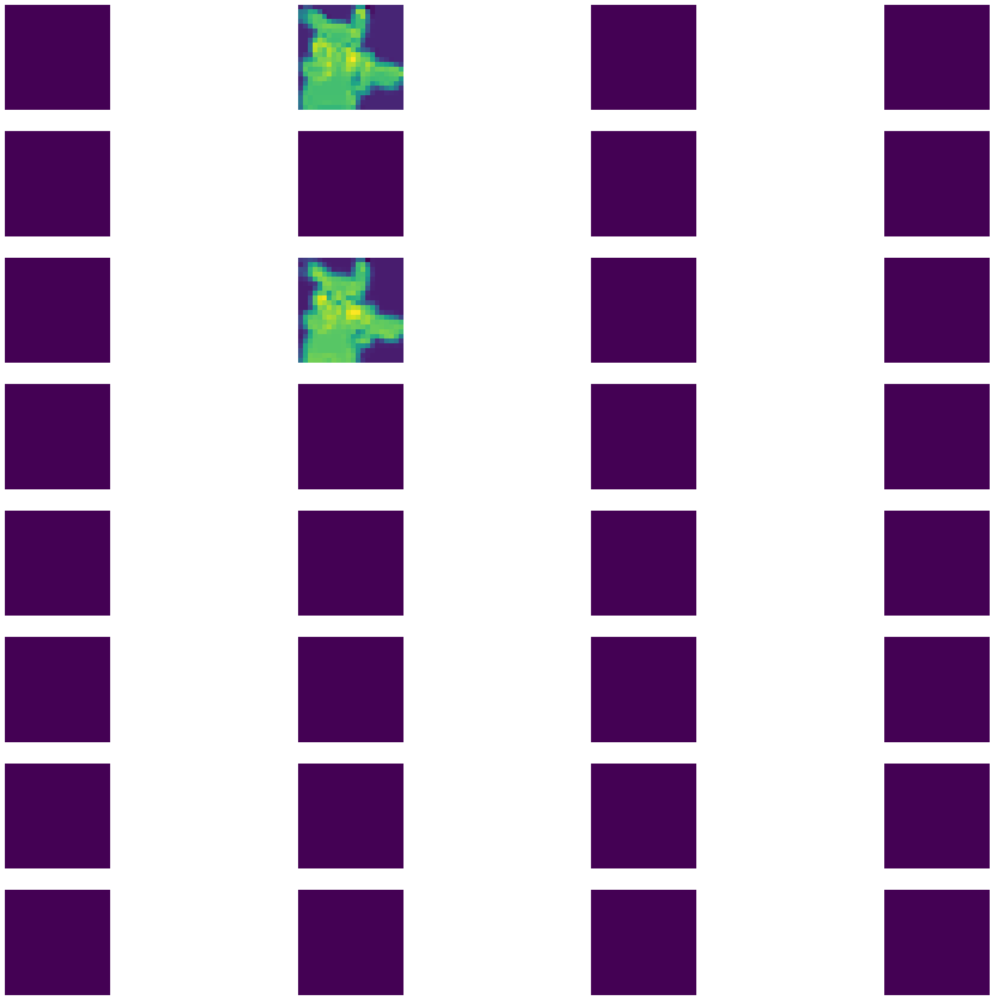

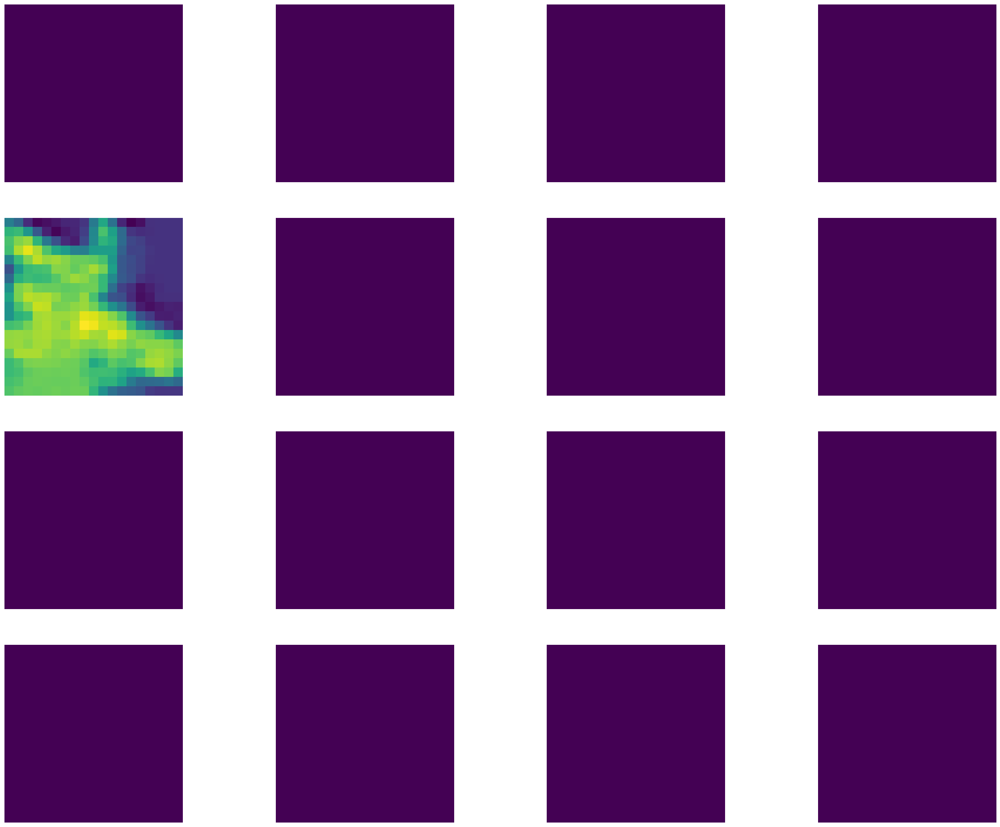

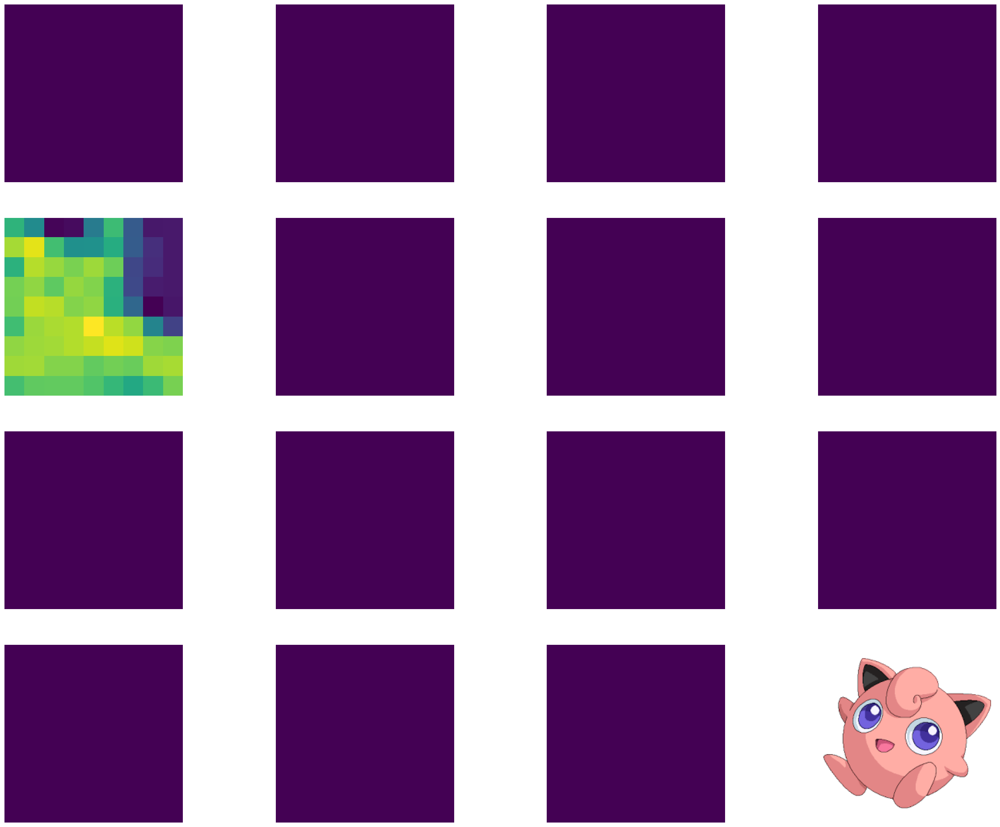

-----------------------------------------------------
1th layer: conv2d_4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
conv2d_4 | Features Shape: (1, 197, 197, 128)
Dimension: 128
-----------------------------------------------------
-----------------------------------------------------
2th layer: max_pooling2d_4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
max_pooling2d_4 | Features Shape: (1, 98, 98, 128)
Dimension: 128
-----------------------------------------------------
-----------------------------------------------------
3th layer: conv2d_5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step
conv2d_5 | Features Shape: (1, 95, 95, 64)
Dimension: 64
-----------------------------------------------------
-----------------------------------------------------
4th layer: max_pooling2d_5
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 589ms/step
max_pooling2d_5 | Features Shape: (1, 47, 47, 64)
Dimension: 64
-----------------------------------------------------
-----------------------------------------------------
5th layer: conv2d

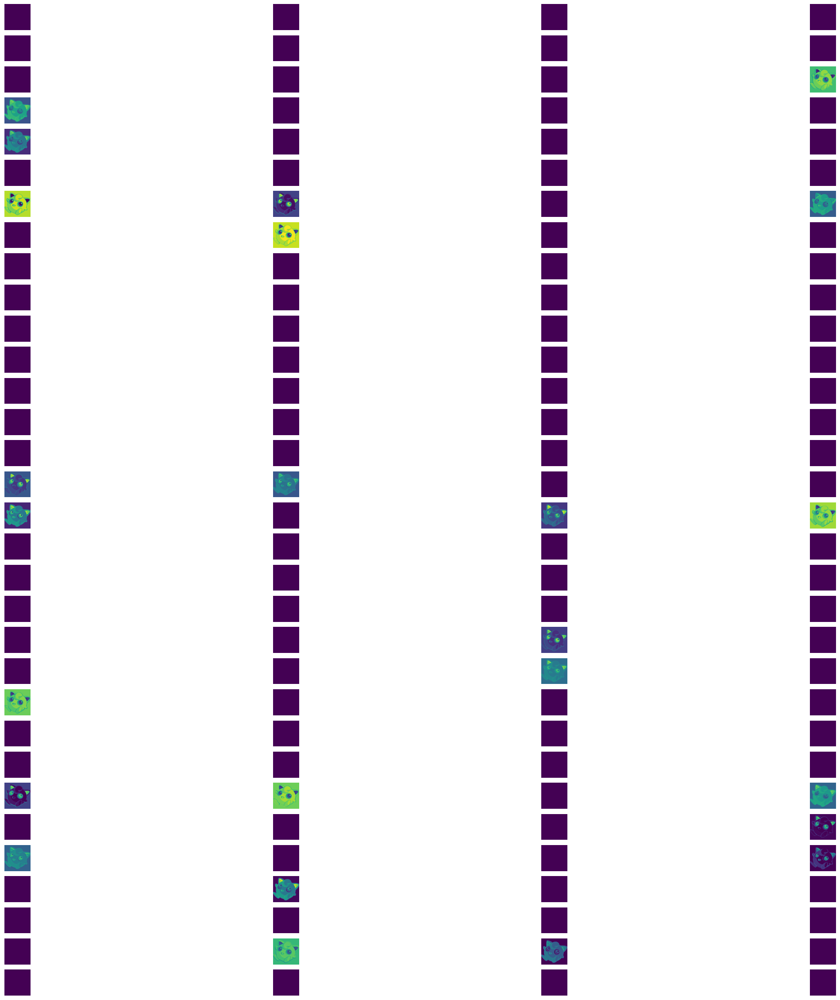

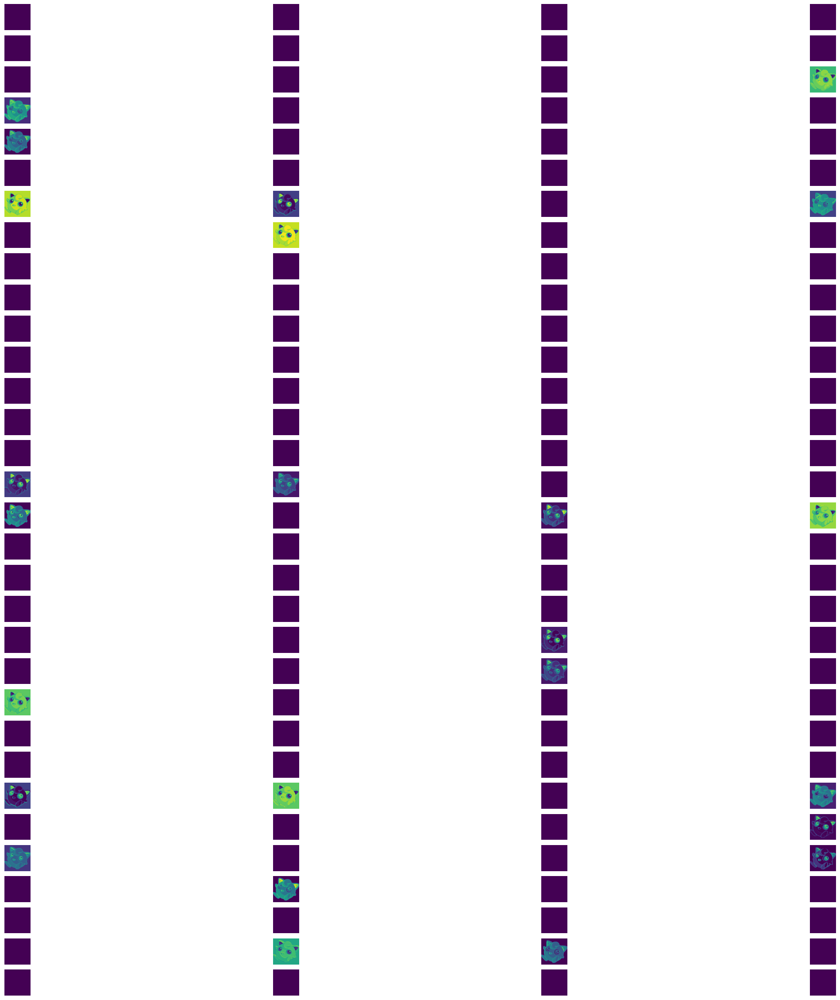

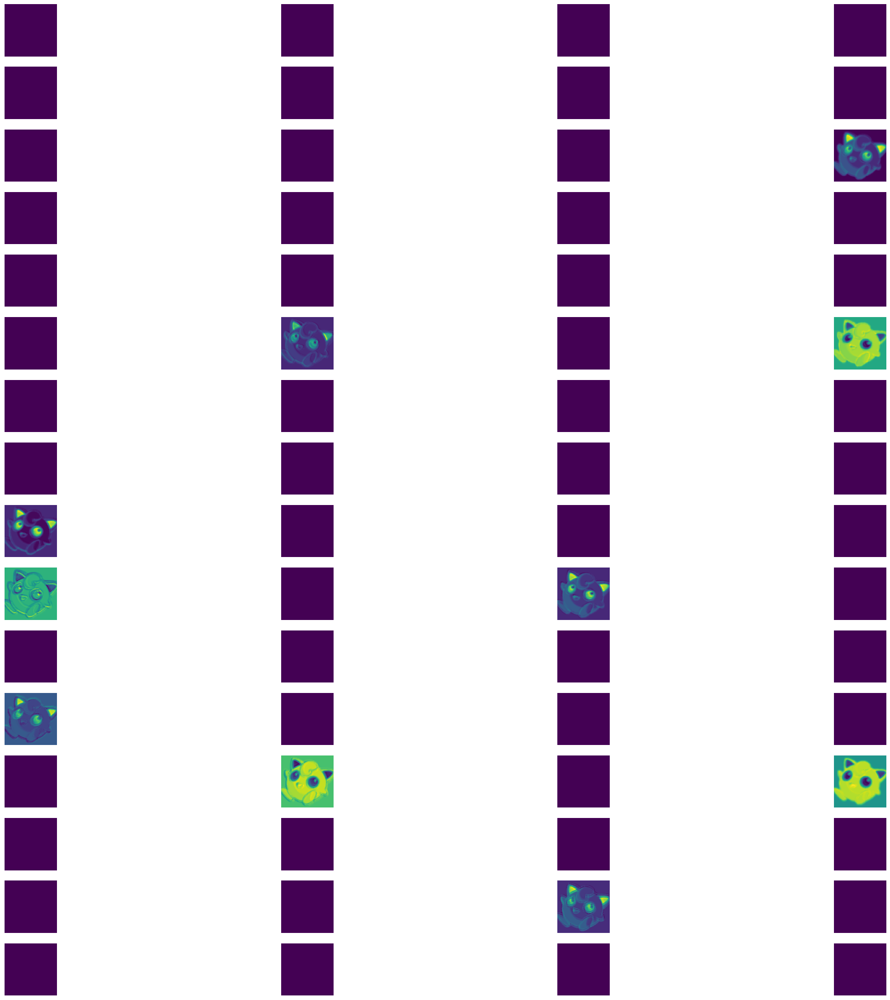

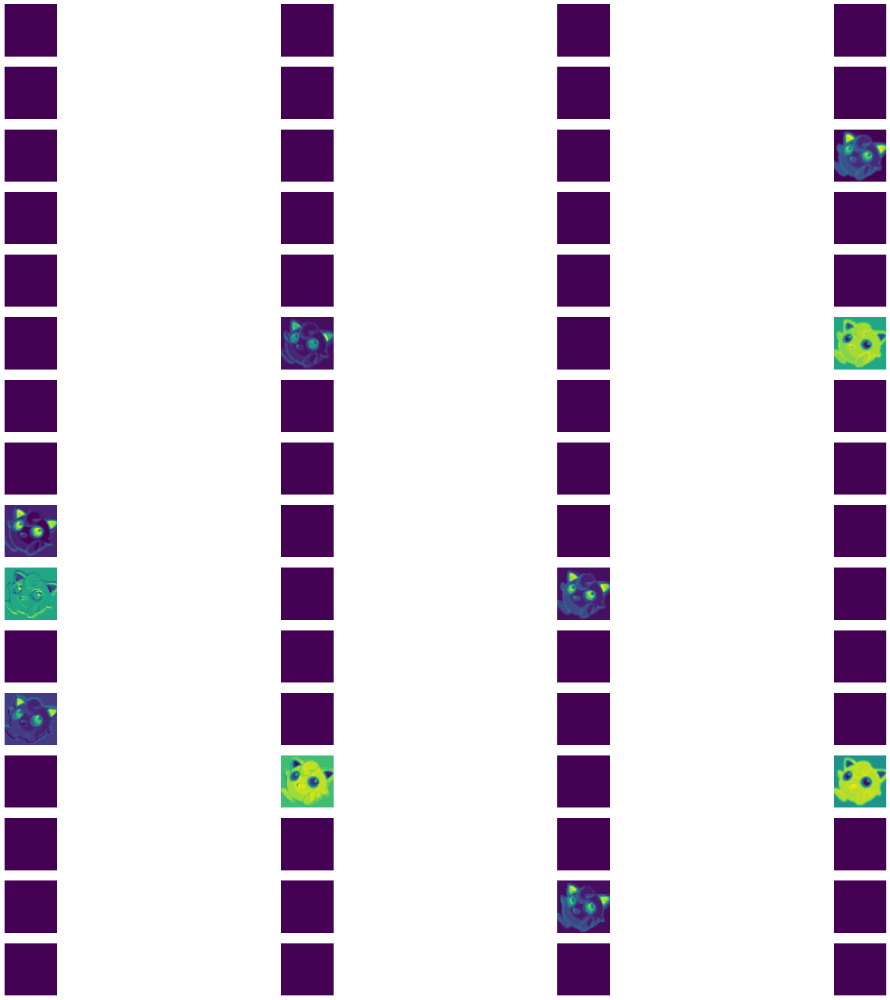

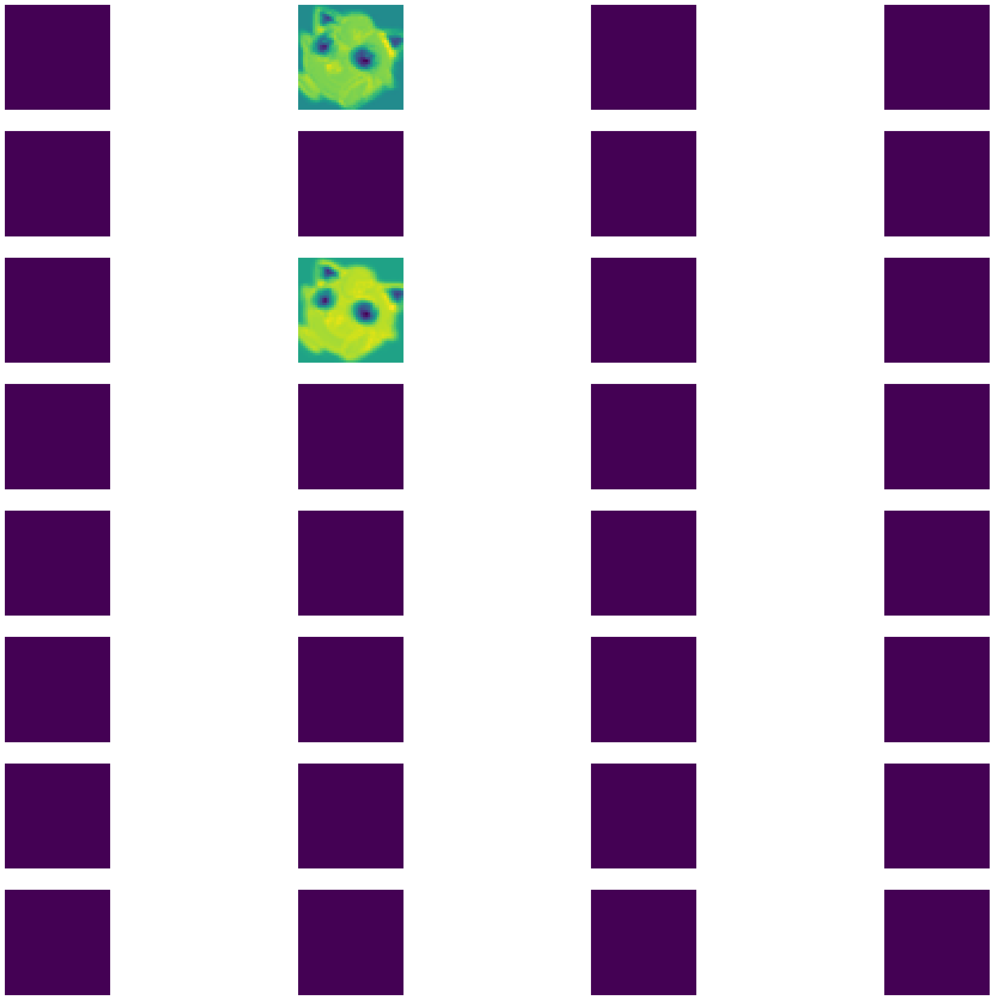

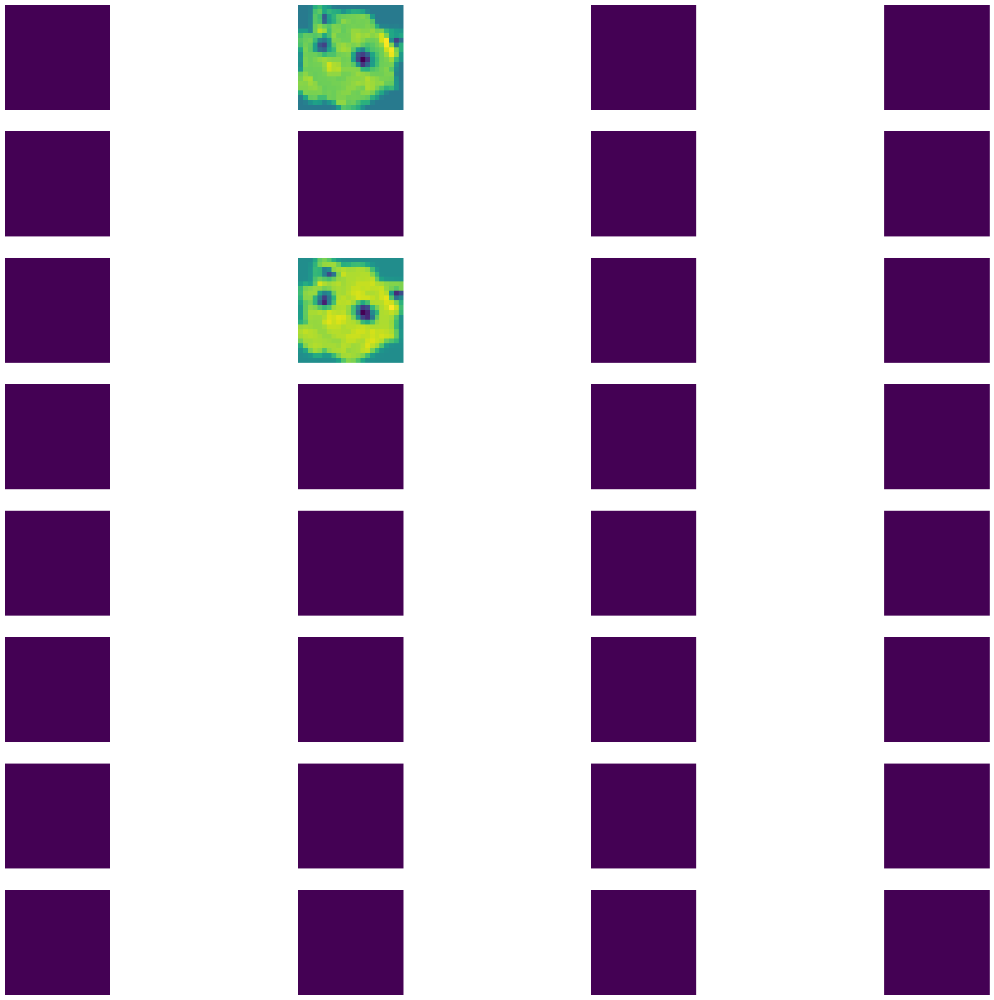

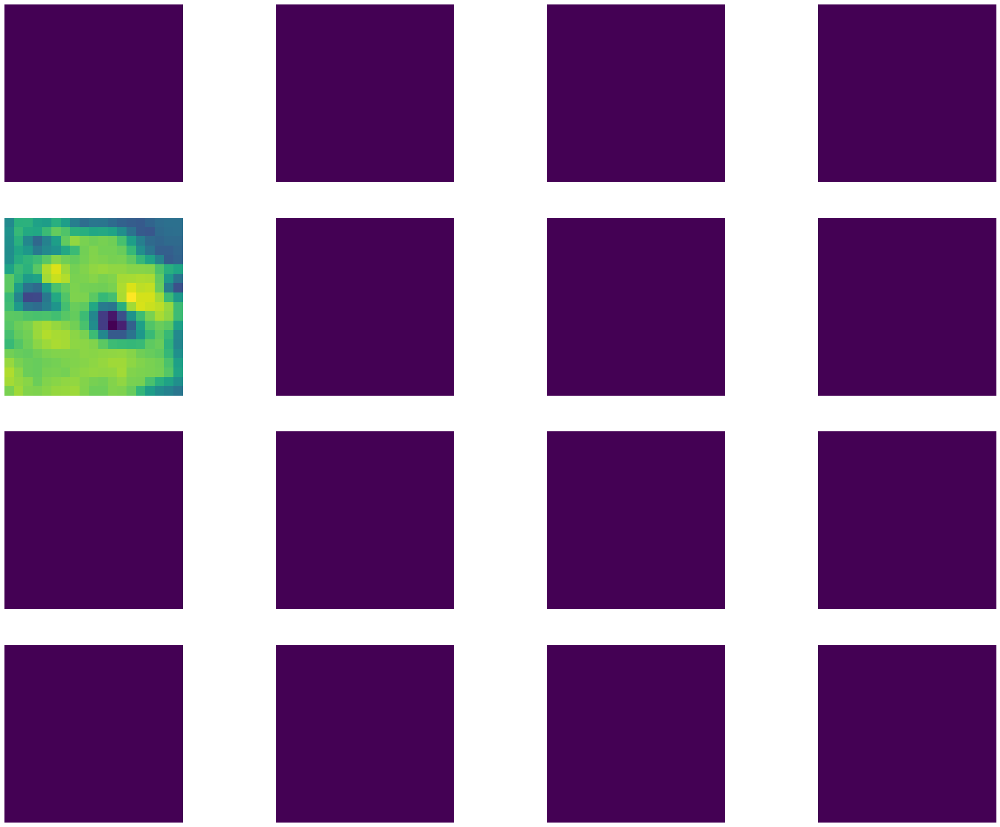

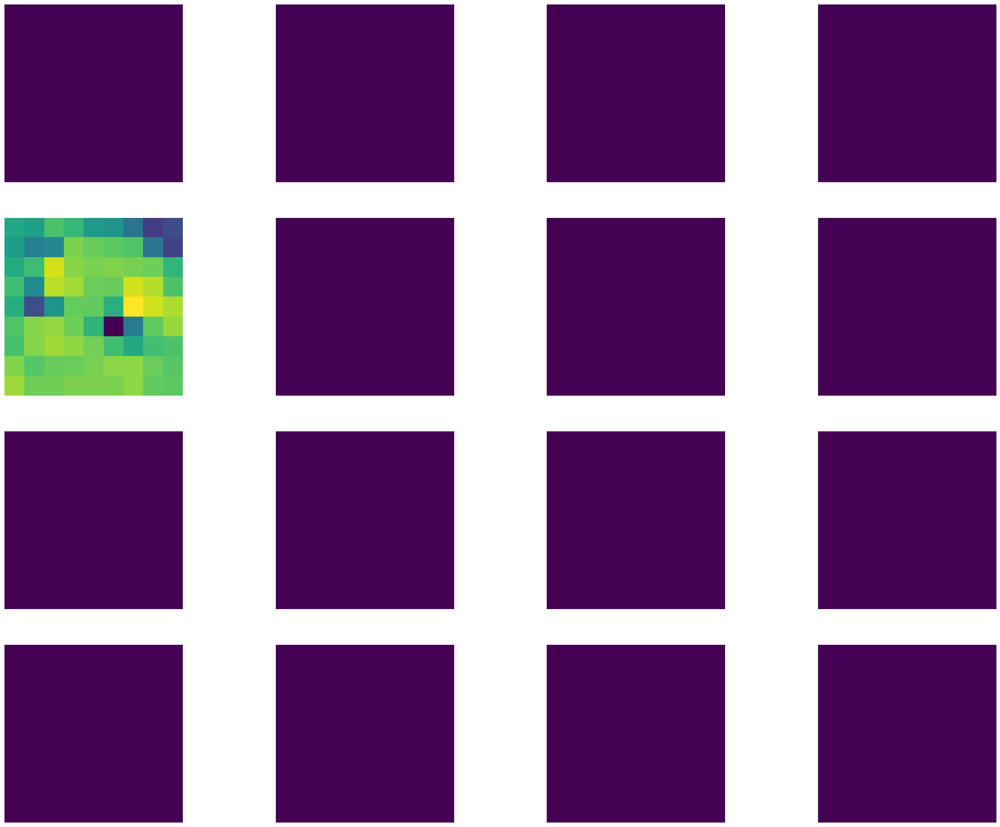

In [33]:
def display_image_filtered(name_image, model, layer_name, image):
    # Récupération des inputs et des outputs de la couche spécifiée
    inp = model.inputs
    out1 = model.get_layer(layer_name).output
    feature_map_model = Model(inputs=inp, outputs=out1)
    
    # Prétraiter l'image
    img = cv2.resize(image, (200, 200))
    input_img = np.expand_dims(img, axis=0) / 255.0  # Normalisation
    
    # Extraire les cartes de caractéristiques
    feature_maps = feature_map_model.predict(input_img)
    dim = feature_maps.shape[-1]
    print(f'{layer_name} | Features Shape: {feature_maps.shape}')
    print(f'Dimension: {dim}')
    
    # Afficher et sauvegarder les cartes de caractéristiques
    if not os.path.exists(f'results_{name_image}'):
        os.makedirs(f'results_{name_image}')
    fig = plt.figure(figsize=(30, 30))
    for i in range(dim):
        ax = fig.add_subplot(dim // 4 + 1, 4, i + 1)
        ax.axis('off')
        ax.imshow(feature_maps[0, :, :, i])
        plt.imsave(f'results_{name_image}/{name_image}_{layer_name}_{i}.jpg', feature_maps[0, :, :, i])

# Lister dynamiquement les couches convolutionnelles et de pooling
layer_names = [layer.name for layer in model.layers if 'conv2d' in layer.name or 'pooling' in layer.name]

num = 33
for name in ['pikachu', 'rondoudou']:
    if name == 'pikachu':
        image = image_pikachu
    elif name == 'rondoudou':
        image = image_array_rondoudou 
    plt.axis('off')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()
    for i, layer_name in enumerate(layer_names):
        print('-----------------------------------------------------')
        print(f'{i+1}th layer: {layer_name}')
        display_image_filtered(name, model, layer_name, image)
        print('-----------------------------------------------------')


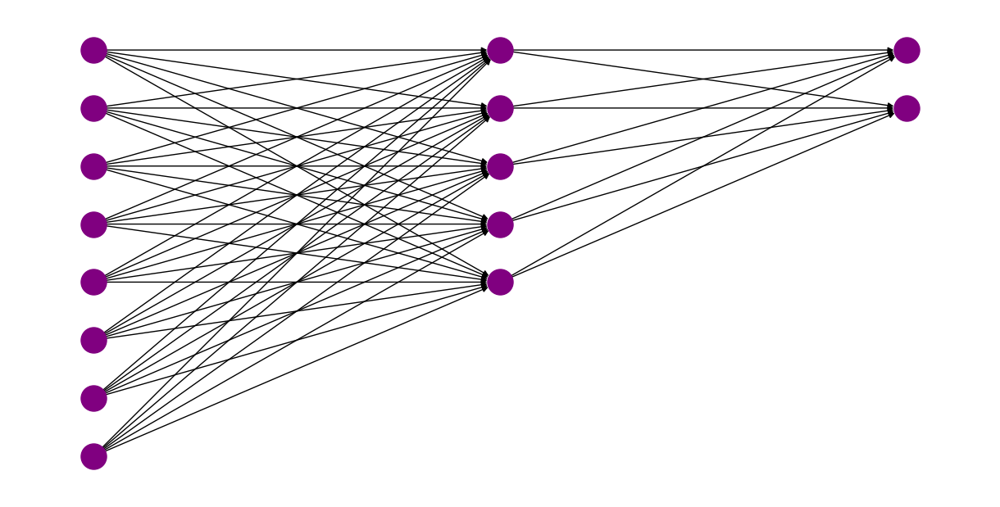

In [37]:
import matplotlib.pyplot as plt
import networkx as nx
 
# Créer un graphe avec NetworkX
def draw_neural_network(layers):
    G = nx.DiGraph()
    pos = {}
    node_count = 0
    layer_count = 0
 
    for layer_size in layers:
        for neuron in range(layer_size):
            G.add_node(node_count)
            pos[node_count] = (layer_count, -neuron)
            node_count += 1
        layer_count += 1
 
    # Ajouter les connexions entre les neurones
    for i in range(len(layers) - 1):
        for j in range(layers[i]):
            for k in range(layers[i + 1]):
                G.add_edge(j + sum(layers[:i]), k + sum(layers[:i + 1]))
 
    # Dessiner le graphe
    plt.figure(figsize=(12, 6))
    nx.draw(G, pos, with_labels=False, node_size=500, node_color="purple", edge_color="black", arrows=True)
    plt.show()
 
# Exemple de réseau : 8 neurones d'entrée, 5 dans une couche cachée, et 2 en sortie
layers = [8, 5, 2]
draw_neural_network(layers)


In [34]:
# Compression des dossiers en ZIP
def zip_folder(folder_name):
    zip_name = f"{folder_name}.zip"
    with zipfile.ZipFile(zip_name, 'w') as zipf:
        for root, dirs, files in os.walk(folder_name):
            for file in files:
                file_path = os.path.join(root, file)
                zipf.write(file_path, os.path.relpath(file_path, folder_name))
    print(f"Dossier {folder_name} compressé en {zip_name}")

zip_folder('results_pikachu')
zip_folder('results_rondoudou')

print("Les fichiers ZIP des résultats sont prêts dans le répertoire courant.")

Dossier results_pikachu compressé en results_pikachu.zip
Dossier results_rondoudou compressé en results_rondoudou.zip
Les fichiers ZIP des résultats sont prêts dans le répertoire courant.


In [35]:
files.download("/content/results_pikachu.zip")
files.download("/content/results_rondoudou.zip")

NameError: name 'files' is not defined

In [ ]:
def display_filter(model, layer_name):
    layer = model.get_layer(layer_name)
    filter, bias= layer.get_weights()
    dim = filter.shape[3]
    print(f'{layer_name} | Filter Shape: {filter.shape} Bias Shape: {bias.shape}')
    print(f'Dimension {dim}')
    f_min, f_max = filter.min(), filter.max()
    filter = (filter - f_min) / (f_max - f_min)
    print(filter.shape)
    fig= plt.figure(figsize=(30,30))
    for i in range(dim):
        ax = fig.add_subplot(dim/2,dim/2,i+1)
        ax.axis('off')
        try:
            ax.imshow(filter[:,:,:,i])
        except:
            ax.imshow(filter[:,:,:,i][0])
            
display_filter(model,f'conv2d_{num}')

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs